## Business problem

# Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')
import pandas_profiling
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor
import xgboost
from sklearn.preprocessing import PolynomialFeatures,StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import mean_squared_error,r2_score,accuracy_score
plt.style.use('ggplot')

## Create UDFs

In [2]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

### Import Data

In [3]:
df=pd.read_excel('D:/E-pi\ML/Capstone_1/Concrete_Data.xlsx')

In [4]:
df

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28.0,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28.0,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270.0,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365.0,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360.0,44.296075
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28.0,44.284354
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28.0,31.178794
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28.0,23.696601
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28.0,32.768036


### Data Inspection

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Cement (component 1)(kg in a m^3 mixture)              1030 non-null   float64
 1   Blast Furnace Slag (component 2)(kg in a m^3 mixture)  1030 non-null   float64
 2   Fly Ash (component 3)(kg in a m^3 mixture)             1030 non-null   float64
 3   Water  (component 4)(kg in a m^3 mixture)              1030 non-null   float64
 4   Superplasticizer (component 5)(kg in a m^3 mixture)    1030 non-null   float64
 5   Coarse Aggregate  (component 6)(kg in a m^3 mixture)   1030 non-null   float64
 6   Fine Aggregate (component 7)(kg in a m^3 mixture)      1030 non-null   float64
 7   Age (day)                                              1030 non-null   float64
 8   Concrete compressive strength(MPa, megapascals)  

#### There are no null values in Data.

In [6]:
df.columns

Index(['Cement (component 1)(kg in a m^3 mixture)',
       'Blast Furnace Slag (component 2)(kg in a m^3 mixture)',
       'Fly Ash (component 3)(kg in a m^3 mixture)',
       'Water  (component 4)(kg in a m^3 mixture)',
       'Superplasticizer (component 5)(kg in a m^3 mixture)',
       'Coarse Aggregate  (component 6)(kg in a m^3 mixture)',
       'Fine Aggregate (component 7)(kg in a m^3 mixture)', 'Age (day)',
       'Concrete compressive strength(MPa, megapascals) '],
      dtype='object')

In [7]:
# change the columns names for simplicity
df.rename(columns={'Cement (component 1)(kg in a m^3 mixture)':'cement',
                   'Blast Furnace Slag (component 2)(kg in a m^3 mixture)':'blast_furnace_slag','Fly Ash (component 3)(kg in a m^3 mixture)':'fly_ash',
                   'Water  (component 4)(kg in a m^3 mixture)':'water','Superplasticizer (component 5)(kg in a m^3 mixture)':'superplasticizer',
                   'Coarse Aggregate  (component 6)(kg in a m^3 mixture)':'coarse_agg','Fine Aggregate (component 7)(kg in a m^3 mixture)':'fine_agg',
                   'Age (day)':'age_day','Concrete compressive strength(MPa, megapascals) ':'concrete_compressive_strength'},inplace=True)

In [8]:
df.head()

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age_day,concrete_compressive_strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28.0,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28.0,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270.0,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365.0,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360.0,44.296075


In [9]:
# profiling using pandas profiling
report = pandas_profiling.ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
# checks duplicates records 
df.duplicated().sum()

25

In [11]:
df[df.duplicated()]

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age_day,concrete_compressive_strength
77,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3.0,33.398217
80,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3.0,33.398217
86,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3.0,35.301171
88,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3.0,35.301171
91,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3.0,35.301171
100,425.0,106.3,0.0,153.5,16.5,852.1,887.1,7.0,49.201007
103,425.0,106.3,0.0,153.5,16.5,852.1,887.1,7.0,49.201007
109,362.6,189.0,0.0,164.9,11.6,944.7,755.8,7.0,55.895819
111,362.6,189.0,0.0,164.9,11.6,944.7,755.8,7.0,55.895819
123,425.0,106.3,0.0,153.5,16.5,852.1,887.1,28.0,60.294676


In [12]:
# drop duplicates records.
df1=df.drop_duplicates()

In [13]:
df1.shape

(1005, 9)

In [14]:
df1.apply(continuous_var_summary)

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age_day,concrete_compressive_strength
N,1005.000000,1005.000000,1005.000000,1005.000000,1005.000000,1005.000000,1005.000000,1005.000000,1005.000000
NMISS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SUM,280022.200000,72403.350000,55812.750000,182984.750000,6061.805000,979248.350000,776550.050000,46086.000000,35426.524241
MEAN,278.629055,72.043134,55.535075,182.074378,6.031647,974.376468,772.686617,45.856716,35.250273
MEDIAN,265.000000,20.000000,0.000000,185.700000,6.100000,968.000000,780.000000,28.000000,33.798114
STD,104.345003,86.170555,64.207448,21.340740,5.919559,77.579534,80.339851,63.734692,16.284808
VAR,10887.879601,7425.364576,4122.596436,455.427169,35.041179,6018.584052,6454.491667,4062.110923,265.194960
MIN,102.000000,0.000000,0.000000,121.750000,0.000000,801.000000,594.000000,1.000000,2.331808
P1,116.000000,0.000000,0.000000,127.012000,0.000000,817.904000,594.000000,3.000000,6.884473
P5,143.620000,0.000000,0.000000,146.140000,0.000000,842.000000,613.000000,3.000000,10.767685


###### it seems that we have an outliers lies.

## EDA 

##### Univariate analysis

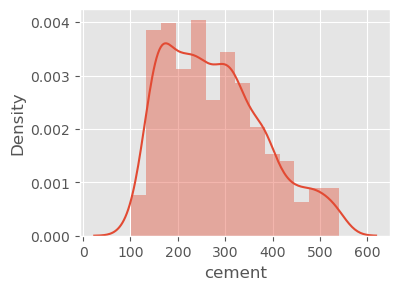

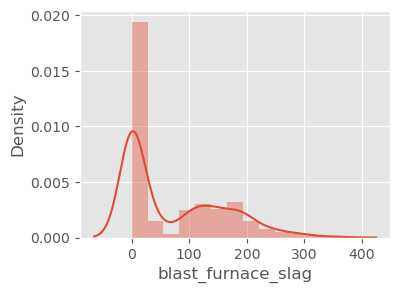

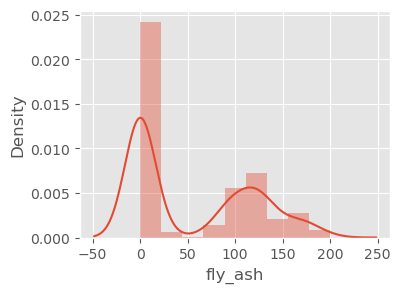

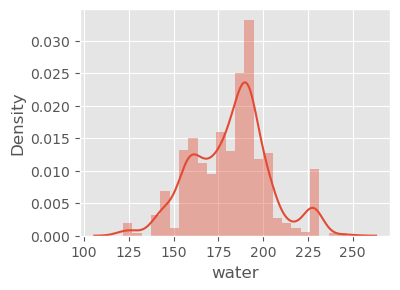

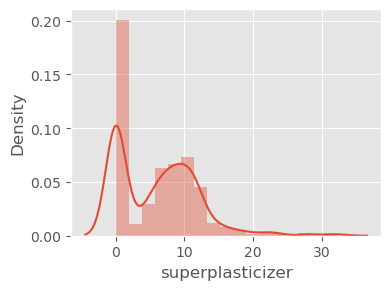

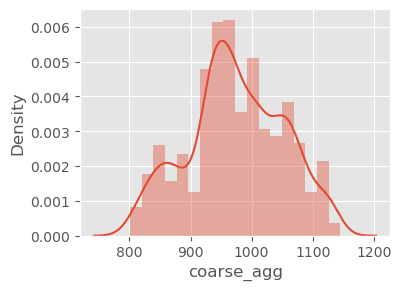

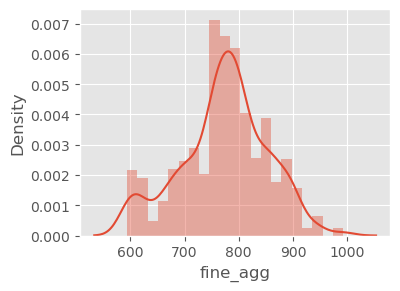

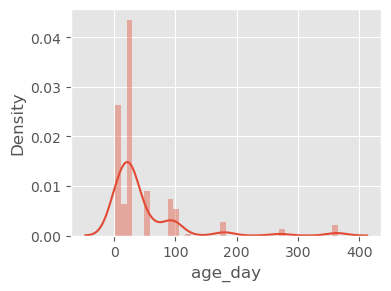

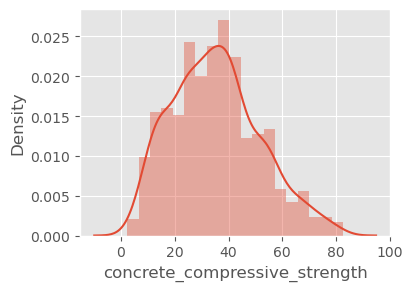

In [15]:
for col in df1.columns:
    plt.figure(figsize=(4,3),dpi=100)
    sns.distplot(df1[col])
    plt.show()

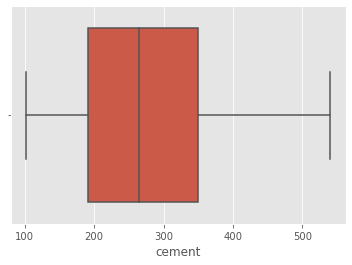

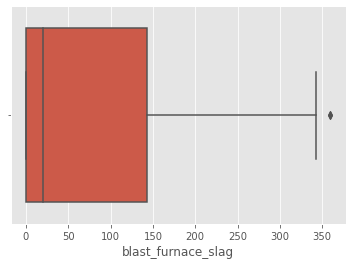

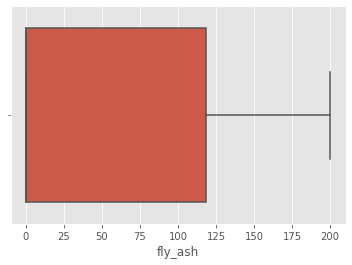

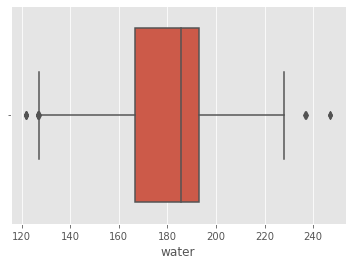

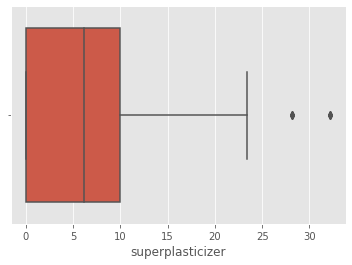

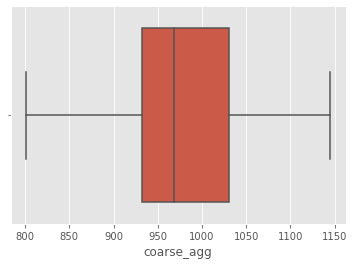

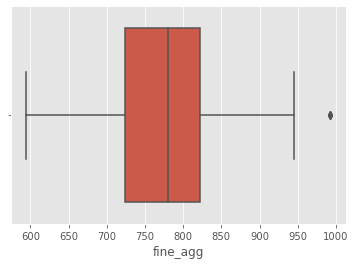

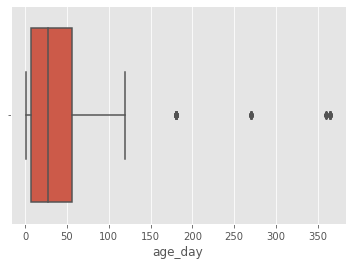

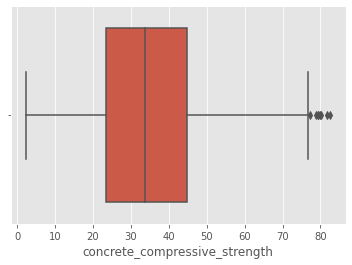

In [16]:
for col in df1.columns:
    sns.boxplot(df1[col])
    plt.show()

-------------------------------------------------------------------------------------------------------------------------------

#### Bivariate analysis

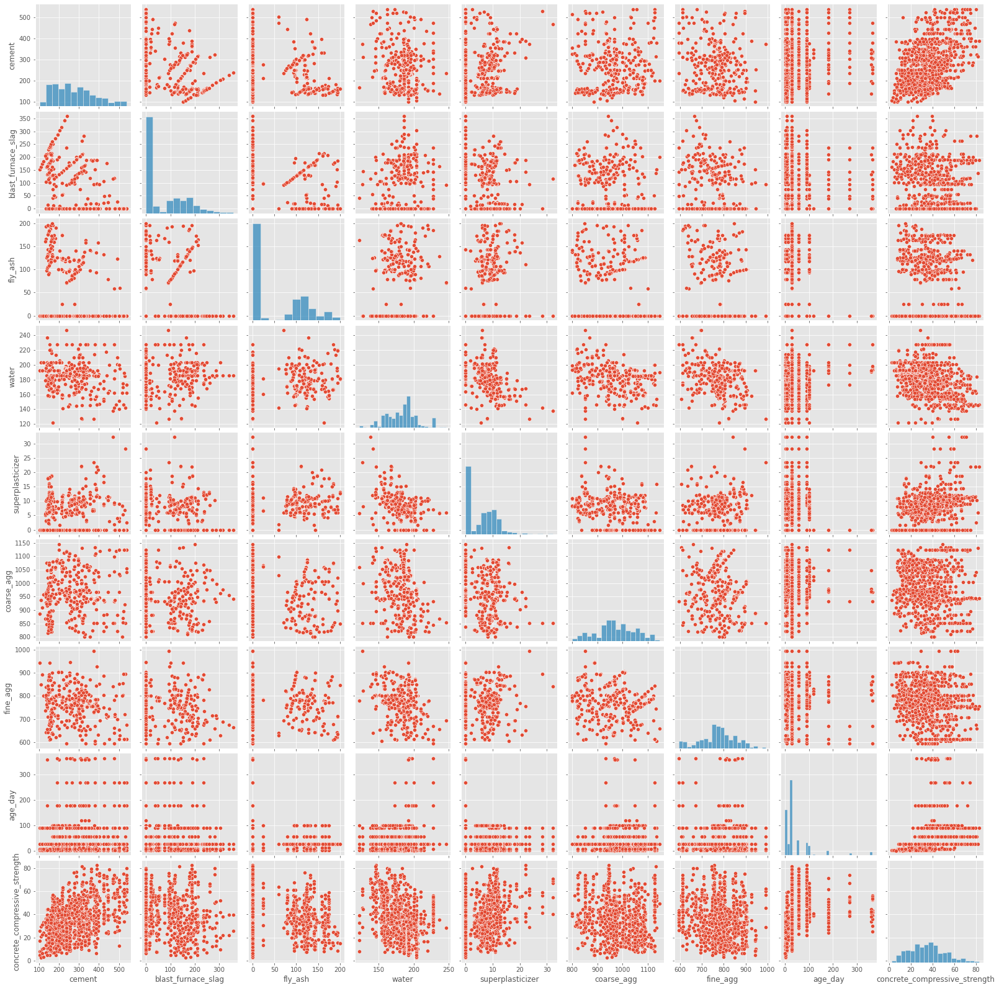

In [17]:
sns.pairplot(df1)
plt.show()

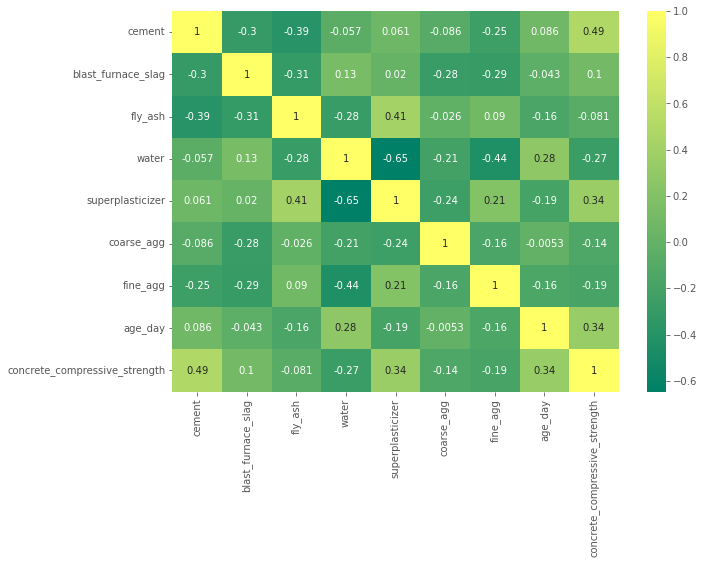

In [18]:
# heatmap
plt.figure(figsize = (10,7))
sns.heatmap(df1.corr(), annot=True,cmap='summer')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Outlier treatment

In [19]:
df1 = df1.apply(lambda x: x.clip(lower = x.quantile(0.01), upper = x.quantile(0.99)))

In [20]:
df1.apply(continuous_var_summary).round(2)

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age_day,concrete_compressive_strength
N,1005.00,1005.00,1005.00,1005.00,1005.00,1005.00,1005.00,1005.00,1005.00
NMISS,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
SUM,280030.70,72048.95,55721.62,182957.53,5993.80,979299.29,776294.95,46090.00,35407.20
MEAN,278.64,71.69,55.44,182.05,5.96,974.43,772.43,45.86,35.23
MEDIAN,265.00,20.00,0.00,185.70,6.10,968.00,780.00,28.00,33.80
STD,104.01,85.17,64.02,21.12,5.67,77.18,79.72,63.73,16.15
VAR,10818.65,7254.08,4098.07,446.22,32.18,5956.29,6355.61,4061.76,260.92
MIN,116.00,0.00,0.00,127.01,0.00,817.90,594.00,3.00,6.88
P1,116.00,0.00,0.00,127.02,0.00,817.91,594.00,3.00,6.89
P5,143.62,0.00,0.00,146.14,0.00,842.00,613.00,3.00,10.77


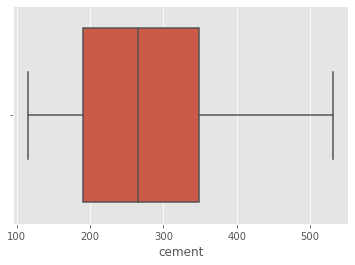

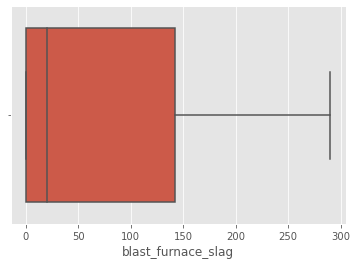

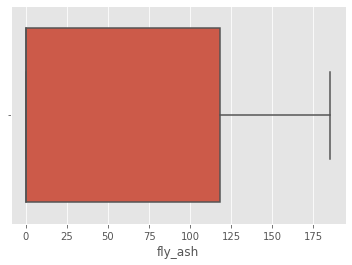

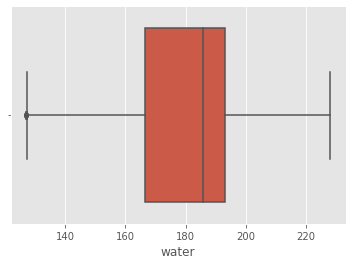

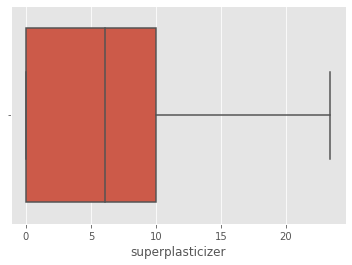

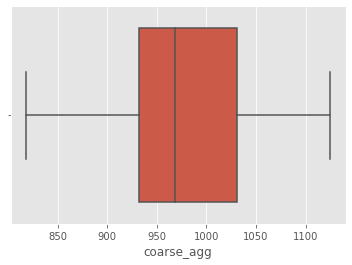

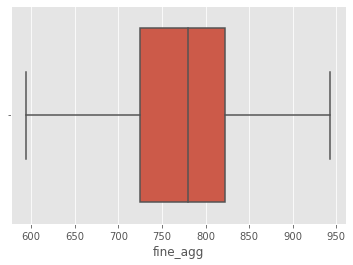

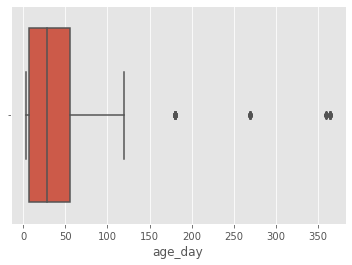

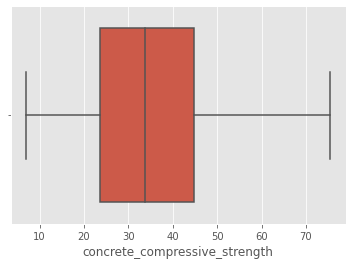

In [21]:
for col in df1.columns:
    sns.boxplot(df1[col])
    plt.show()

##### Domain Knowledge from Civil Engineers; concrete strength test gives it max values after 28 days so any outliers i will 
##### replace it with 28 days.

In [22]:
q1=df1.quantile(0.25)
q3=df1.quantile(0.75)
iqr=q3-q1
age_high=(q3.age_day + (1.5*iqr.age_day))
age_high

129.5

In [23]:
#df1.age_day=np.where(df1.age_day>129,28,df1.age_day)

In [23]:
index=np.where(df1.age_day>age_high)

In [24]:
df1=df1.drop(df1.index[index])

In [25]:
df1.reset_index()

,index,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age_day,concrete_compressive_strength
0,0,531.3,0.0,0.0,162.0,2.5,1040.000,676.0,28.0,75.477214
1,1,531.3,0.0,0.0,162.0,2.5,1055.000,676.0,28.0,61.887366
2,5,266.0,114.0,0.0,228.0,0.0,932.000,670.0,90.0,47.029847
3,7,380.0,95.0,0.0,228.0,0.0,932.000,594.0,28.0,36.447770
4,8,266.0,114.0,0.0,228.0,0.0,932.000,670.0,28.0,45.854291
...,...,...,...,...,...,...,...,...,...,...
941,1025,276.4,116.0,90.3,179.6,8.9,870.100,768.3,28.0,44.284354
942,1026,322.2,0.0,115.6,196.0,10.4,817.904,813.4,28.0,31.178794
943,1027,148.5,139.4,108.6,192.7,6.1,892.400,780.0,28.0,23.696601
944,1028,159.1,186.7,0.0,175.6,11.3,989.600,788.9,28.0,32.768036


In [26]:
df1.shape

(946, 9)

In [27]:
df1.apply(continuous_var_summary)

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age_day,concrete_compressive_strength
N,946.000000,946.000000,946.000000,946.000000,946.000000,946.000000,946.000000,946.000000,946.000000
NMISS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SUM,260458.200000,68543.850000,55721.618000,170520.532000,5993.805000,921946.494000,734644.150000,30630.000000,32801.677581
MEAN,275.325793,72.456501,58.902345,180.254262,6.335946,974.573461,776.579440,32.378436,34.674078
MEDIAN,254.500000,20.000000,0.000000,184.000000,6.720000,970.000000,780.090000,28.000000,33.377533
STD,103.478047,85.611312,64.420700,19.968273,5.642130,78.129493,76.204453,28.491650,16.279196
VAR,10707.706221,7329.296671,4150.026535,398.731933,31.833634,6104.217713,5807.118713,811.774095,265.012216
MIN,116.000000,0.000000,0.000000,127.012000,0.000000,817.904000,594.000000,3.000000,6.884473
P1,116.000000,0.000000,0.000000,127.012000,0.000000,817.904000,594.000000,3.000000,6.884473
P5,143.150000,0.000000,0.000000,146.000000,0.000000,838.525000,630.000000,3.000000,10.535366


In [28]:
df_final=df1.copy()

### Feature engineering

##### We can create 2 derived features using  cement-water  and coarse_agg -  fine_agg.

In [29]:
df_final['cement_water_ratio']=df_final.cement/df_final.water
df_final['average_agg']=(df_final.coarse_agg + df_final.fine_agg)/2
df_final.drop(columns=['cement','water','coarse_agg','fine_agg'],inplace=True)

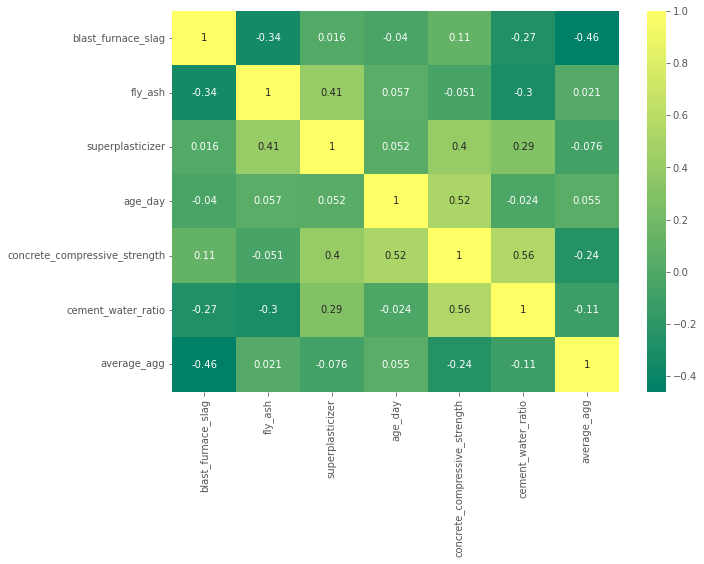

In [30]:
# heatmap
plt.figure(figsize = (10,7))
sns.heatmap(df_final.corr(), annot=True,cmap='summer')
plt.show()

###### The concrete strength has good amount of correlation with age and new feature cement_water_ratio

In [31]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [32]:
#Selecting features
features = df_final[df_final.columns.difference( ['concrete_compressive_strength'] )]
target = df_final['concrete_compressive_strength']

In [33]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(features.values, i) for i in range(features.shape[1])]
vif["features"] = features.columns

In [34]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
1,17.105924,average_agg
3,11.759498,cement_water_ratio
5,4.265461,superplasticizer
4,3.973684,fly_ash
2,2.399721,blast_furnace_slag
0,2.311280,age_day


##### There are no significant multicollinarity between features.

------------------------------------------------------------------------------------------------------------------------------

##### Check skewness

In [35]:
df_final.skew()

blast_furnace_slag               0.782797
fly_ash                          0.386204
superplasticizer                 0.577394
age_day                          1.249429
concrete_compressive_strength    0.426196
cement_water_ratio               0.881559
average_agg                     -0.465421
dtype: float64

##### Considers only features above -0.5/+0.5

In [36]:
from sklearn.preprocessing import PowerTransformer
scaler=PowerTransformer(method='yeo-johnson')

In [37]:
for i in df_final.columns.difference(['concrete_compressive_strength']):
    df_final[i]=scaler.fit_transform(df_final[i].values.reshape(-1,1))

In [38]:
df_final.skew()

blast_furnace_slag              -0.000597
fly_ash                          0.063052
superplasticizer                -0.213799
age_day                         -0.049666
concrete_compressive_strength    0.426196
cement_water_ratio               0.036923
average_agg                     -0.064496
dtype: float64

In [39]:
df_final

,blast_furnace_slag,fly_ash,superplasticizer,age_day,concrete_compressive_strength,cement_water_ratio,average_agg
0,-1.043897,-0.976548,-0.440226,0.188982,75.477214,2.009530,-0.454160
1,-1.043897,-0.976548,-0.440226,0.188982,61.887366,2.009530,-0.306530
5,0.926638,-0.976548,-1.290115,1.592391,47.029847,-0.517801,-1.435874
7,0.851575,-0.976548,-1.290115,0.188982,36.447770,0.375623,-1.966352
8,0.926638,-0.976548,-1.290115,0.188982,45.854291,-0.517801,-1.435874
...,...,...,...,...,...,...,...
1025,0.933805,0.926736,0.633212,0.188982,44.284354,0.175323,-1.148111
1026,-1.043897,1.020350,0.813196,0.188982,31.178794,0.341051,-1.206019
1027,1.009596,0.996741,0.244348,0.188982,23.696601,-1.510952,-0.858036
1028,1.130306,-0.976548,0.914086,0.188982,32.768036,-1.133077,0.191857


### splitting the data.

In [40]:
X=df_final.drop('concrete_compressive_strength',axis=1)
y=df_final['concrete_compressive_strength']

In [41]:
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,1) == round(r2_score(y_test,pred_test)*100,1):
        print('At Random statse: ', i)
        print('Training R2_score is: ',r2_score(y_train,pred_train)*100)
        print('Testing R2_score is: ',r2_score(y_test,pred_test)*100, '\n')
    

At Random statse:  12
Training R2_score is:  81.47816778330098
Testing R2_score is:  81.46327966611679 

At Random statse:  30
Training R2_score is:  81.45628195402755
Testing R2_score is:  81.53551457071595 

At Random statse:  66
Training R2_score is:  81.49209299788401
Testing R2_score is:  81.46938225710933 



###### Chossing random_state: 12

In [42]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=12)

##### Standarization of data.

In [42]:
#sc=StandardScaler()
#x_train_sc=sc.fit_transform(x_train)
#x_test_sc=sc.transform(x_test)

## Model Algo

### LinearRegression

In [43]:
lr=LinearRegression()
lr.fit(x_train,y_train)

LinearRegression()

In [44]:
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)

In [45]:
r_squared = r2_score(y_train, pred_train)
print('The R-square value is: ', r_squared.round(4))

The R-square value is:  0.8148


In [46]:
r_squared = r2_score(y_test, pred_test)
print('The R-square value is: ', r_squared.round(4))

The R-square value is:  0.8146


In [47]:
mse = mean_squared_error(y_test, pred_test)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  7.356


##### Polynominal

In [48]:
poly=PolynomialFeatures(degree=3)
xtrain_poly=poly.fit_transform(x_train)
xtest_poly=poly.transform(x_test)

In [49]:
lr2=LinearRegression()
lr2.fit(xtrain_poly,y_train)

LinearRegression()

In [50]:
pred_train=lr2.predict(xtrain_poly)
pred_test=lr2.predict(xtest_poly)

In [51]:
r2_train = r2_score(y_train, pred_train)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.8146


In [52]:
r2_test = r2_score(y_test, pred_test)
print('The test R-square value is: ', r_squared.round(4))

The test R-square value is:  0.8146


In [53]:
mse = mean_squared_error(y_test, pred_test)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  6.4227


#### Cross validation of the Model

In [54]:
for i in(2,10):
    cv_score=cross_val_score(lr2,X,y,cv=i)
    cv_mean= cv_score.mean()
    print(f'At Cross fold {i} the cv score is {cv_mean} , training accuracy score= {r2_train} & testing accuracy score= {r2_test}')
    print('\n')

At Cross fold 2 the cv score is 0.6311532273806403 , training accuracy score= 0.9123730463793637 & testing accuracy score= 0.858688926516333


At Cross fold 10 the cv score is 0.7209258449170275 , training accuracy score= 0.9123730463793637 & testing accuracy score= 0.858688926516333




In [53]:
# try Rideg and Lasso Regularization to prevent overfitting with polynomial degree=3

In [55]:
tuned_parameters = [{'alpha': [0.0001,0.001,0.01,0.1,1.]}]

LassoCV = GridSearchCV(Lasso(),
                   tuned_parameters,
                   cv=10,
                   n_jobs=-1,
                   scoring='neg_mean_squared_error',
                   verbose=10)

LassoCV.fit(xtrain_poly,y_train)

print('Best combination:', LassoCV.best_params_);

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Best combination: {'alpha': 0.01}


In [56]:
Lasso=Lasso(alpha=0.01)
lasso_model=Lasso.fit(xtrain_poly,y_train)

train_pred=lasso_model.predict(xtrain_poly)
test_pred=lasso_model.predict(xtest_poly)

In [57]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9098


In [58]:
r_squared = r2_score(y_test, test_pred)
print('The test R-square value is: ', r_squared.round(4))

The test R-square value is:  0.869


In [59]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  6.1833


-------------------------------------------------------------------------------------------------------------------------------

In [61]:
tuned_parameters = [{'alpha': [0.0001,0.001,0.01,0.1,1.,10.]}]

RidgeCV = GridSearchCV(Ridge(),
                   tuned_parameters,
                   cv=10,
                   n_jobs=-1,
                   scoring='neg_mean_squared_error',
                   verbose=10)

RidgeCV.fit(xtrain_poly,y_train)

print('Best combination:', RidgeCV.best_params_);

Fitting 10 folds for each of 6 candidates, totalling 60 fits
Best combination: {'alpha': 1.0}


In [62]:
Ridge=Ridge(alpha=1.0)
ridge_model=Ridge.fit(xtrain_poly,y_train)

train_pred=ridge_model.predict(xtrain_poly)
test_pred=ridge_model.predict(xtest_poly)

In [63]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.911


In [64]:
r_squared = r2_score(y_test, test_pred)
print('The test R-square value is: ', r_squared.round(4))

The test R-square value is:  0.8621


In [65]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  6.3452


-------------------------------------------------------------------------------------------------------------------------------

### KNN

In [67]:
knn=KNeighborsRegressor()

In [68]:
knn_params={'n_neighbors':[3,5,7,9],'weights':['distance','uniform'],'metric':['manhatten','euclidean']}
knn_model= GridSearchCV(knn,knn_params,cv=10,n_jobs=-1,verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 16 candidates, totalling 160 fits


In [69]:
knn_model.best_params_

{'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'distance'}

In [70]:
knn_model = KNeighborsRegressor(n_neighbors=7, weights='distance',metric='euclidean').fit(x_train, y_train)

In [71]:
train_pred=knn_model.predict(x_train)
test_pred=knn_model.predict(x_test)

In [72]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9965


In [73]:
r_squared = r2_score(y_test, test_pred)
print('The test R-square value is: ', r_squared.round(4))

The test R-square value is:  0.8828


In [74]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  5.8485


-------------------------------------------------------------------------------------------------------------------------------

### SVM

In [75]:
regressor=SVR(kernel='rbf')

In [76]:
svr_params={'C':[1,5,10,15,20,30,50],'gamma':[0.01,0.1,0.2,0.3],'epsilon':[0.01,0.1,1.0]}

In [77]:
svr_model=GridSearchCV(regressor,svr_params,cv=10,n_jobs=-1,verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 84 candidates, totalling 840 fits


In [78]:
svr_model.best_params_

{'C': 50, 'epsilon': 1.0, 'gamma': 0.3}

In [79]:
svr_model=svr_model.best_estimator_

In [80]:
train_pred=svr_model.predict(x_train)
test_pred=svr_model.predict(x_test)

In [81]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9365


In [82]:
r_squared = r2_score(y_test, test_pred)
print('The test R-square value is: ', r_squared.round(4))

The test R-square value is:  0.8888


In [83]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  5.6972


-------------------------------------------------------------------------------------------------------------------------------

### DT

In [85]:
dt=DecisionTreeRegressor()

In [87]:
dt_params={'max_depth': np.arange(3,10),'min_samples_split':range(3,10),'min_samples_leaf':range(2,7),
           'max_features': np.arange(4,8)}

In [88]:
dt_model=GridSearchCV(dt,dt_params,cv=10,n_jobs=-1,verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 980 candidates, totalling 9800 fits


In [89]:
dt_model.best_params_

{'max_depth': 9,
 'max_features': 5,
 'min_samples_leaf': 2,
 'min_samples_split': 4}

In [90]:
dt_model=dt_model.best_estimator_

In [91]:
train_pred=dt_model.predict(x_train)
test_pred=dt_model.predict(x_test)

In [92]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9543


In [93]:
r_squared = r2_score(y_test, test_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.8555


In [94]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  6.4936


-------------------------------------------------------------------------------------------------------------------------------

## Ensembles Techniques

### Bagging : RandomForest

In [95]:
rf=RandomForestRegressor()

In [96]:
rf_params={'n_estimators': [40,50,60,70,100,150,200,250,300,350,400,500],'max_depth':range(2,13)}

In [97]:
rf_model=GridSearchCV(rf,rf_params,cv=10,n_jobs=-1,verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 132 candidates, totalling 1320 fits


In [98]:
rf_model.best_params_

{'max_depth': 12, 'n_estimators': 250}

In [99]:
rf_model=rf_model.best_estimator_

In [100]:
train_pred=rf_model.predict(x_train)
test_pred=rf_model.predict(x_test)

In [101]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9835


In [102]:
r_squared = r2_score(y_test, test_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9192


In [103]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  4.8574


In [105]:
ourscores= cross_val_score(rf,x_train,y_train,scoring='r2',n_jobs=-1,cv=10)
print(np.mean(ourscores),np.std(ourscores))
print(ourscores)

0.8914755662292475 0.04084922992103054
[0.90660622 0.86445123 0.84660061 0.95178283 0.8595305  0.87750206
 0.92725241 0.89623894 0.95386293 0.83092794]


-------------------------------------------------------------------------------------------------------------------------------

### Boosting

##### AdaBoostRegressor

In [106]:
ada=AdaBoostRegressor()

In [107]:
ada_params={'n_estimators': [60,70,80,100,150,200,250],'learning_rate': [10 ** x for x in range(-4, 3)]}

In [108]:
ada_model=GridSearchCV(ada,ada_params,cv=10,n_jobs=-1,verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 49 candidates, totalling 490 fits


In [109]:
ada_model.best_params_

{'learning_rate': 1, 'n_estimators': 70}

In [110]:
ada_model=ada_model.best_estimator_

In [111]:
train_pred=rf_model.predict(x_train)
test_pred=rf_model.predict(x_test)

In [112]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9835


In [113]:
r_squared = r2_score(y_test, test_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9192


In [114]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  4.8574


-------------------------------------------------------------------------------------------------------------------------------

##### GradientBoost

In [115]:
gb=GradientBoostingRegressor()

In [119]:
gb_params={'n_estimators': [100,300,500,700,1000],'max_depth':[1,2,3],'learning_rate': [10 ** x for x in range(-4, 3)]}


In [120]:
gb_model=GridSearchCV(gb,gb_params,cv=10,n_jobs=-1,verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 84 candidates, totalling 840 fits


In [121]:
gb_model.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 1000}

In [122]:
gb_model=gb_model.best_estimator_

In [123]:
train_pred=gb_model.predict(x_train)
test_pred=gb_model.predict(x_test)

In [124]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9917


In [125]:
r_squared = r2_score(y_test, test_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.929


In [126]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  4.551


In [128]:
ourscores= cross_val_score(gb,x_train,y_train,scoring='r2',n_jobs=-1,cv=10)
print(np.mean(ourscores),np.std(ourscores))
print(ourscores)

0.894829294984266 0.03445532959586083
[0.88927636 0.87605589 0.86716192 0.93816425 0.84373539 0.89244384
 0.90340864 0.93687005 0.94707153 0.85410508]


------------------------------------------------------------------------------------------------------------------------------

##### XGBoost

In [129]:
xgb=xgboost.XGBRegressor()

In [130]:
xgb_params={ 'learning_rate':[0.01,0.1,0.15,0.3],'n_estimators':[50,100,200,300,500,700],'max_depth':[2,3,4,5]}

In [ ]:
'ourlearning_rate': 0.01659317727496269,
 'estimators': 2327,
 'sample': 0.47578901838676857,
 'depth': 18,
 'alpha': 0.0012285779590065602,
 'lambda': 2.2909661162534096,
 'colsample_bytree': 0.8997221231632073,
 'ourgamma': 1.685821001067401,
 'childweight': 4

In [ ]:
xgb_params={ 'learning_rate':[0.01,0.1,0.15,0.3],'n_estimators':[50,100,200,300,500,700],'max_depth':[2,3,4,5]}

In [132]:
xgb_model=GridSearchCV(xgb,xgb_params,cv=10,n_jobs=-1,verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 96 candidates, totalling 960 fits


In [133]:
xgb_model.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 700}

In [134]:
xgb_model= xgb_model.best_estimator_

In [135]:
train_pred=xgb_model.predict(x_train)
test_pred=xgb_model.predict(x_test)

In [136]:
r_squared = r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9872


In [137]:
r_squared = r2_score(y_test, test_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9281


In [138]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  4.5798


In [140]:
ourscores= cross_val_score(xgb_model,x_train,y_train,scoring='r2',n_jobs=-1,cv=10)
print(np.mean(ourscores),np.std(ourscores))
print(ourscores)

0.9242071595225347 0.025086013676737226
[0.89727718 0.93200854 0.89743292 0.95726516 0.89018056 0.90910898
 0.94844642 0.94942868 0.95292975 0.90799341]


-------------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

##### Using OPTUNA to automate the hyperparameter search.

In [141]:
def return_score(param):
    Model=xgboost.XGBRegressor(**param)
    rootmeansquarederror= np.mean(cross_val_score(Model,x_train,y_train,cv=10,scoring='r2',n_jobs=-1))
    return rootmeansquarederror

In [142]:
from optuna import Trial,visualization
from optuna.samplers import TPESampler

In [143]:
def objective(trial):
    parameter={
        
        'learning_rate': trial.suggest_uniform('ourlearning_rate',0.01,0.2),
        'n_estimators': trial.suggest_int('estimators',300,2000),
        'subsample': trial.suggest_uniform('sample',0.4,0.9),
        'max_depth': trial.suggest_int('depth',2,20),
        'reg_alpha': trial.suggest_loguniform('alpha',1e-3,10.0),
        'reg_lambda': trial.suggest_loguniform('lambda',1e-3,10.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree',0.4,0.9),
        'gamma': trial.suggest_loguniform('ourgamma',1e-3,10.0),
        'mini_child_weight': trial.suggest_int('childweight',0,10),
        'nthread':-1
    
    
    }    
    return(return_score(parameter))

In [144]:
study= optuna.create_study(direction='maximize',sampler=TPESampler())
study.optimize(objective,n_trials=120,n_jobs=-1)



[I 2022-10-23 11:27:10,219] A new study created in memory with name: no-name-50f9f4c7-8482-46d5-9b0b-ffe2b36117b6
[I 2022-10-23 11:27:26,559] Trial 1 finished with value: 0.917009197360563 and parameters: {'ourlearning_rate': 0.11960771767315927, 'estimators': 538, 'sample': 0.7595097372104674, 'depth': 2, 'alpha': 0.007348529950416719, 'lambda': 0.02571291929442752, 'colsample_bytree': 0.5274177604094117, 'ourgamma': 6.189481970391079, 'childweight': 0}. Best is trial 1 with value: 0.917009197360563.
[I 2022-10-23 11:27:27,647] Trial 0 finished with value: 0.9174486366291669 and parameters: {'ourlearning_rate': 0.14316940573702197, 'estimators': 1300, 'sample': 0.7346777093552599, 'depth': 3, 'alpha': 0.004314509802570219, 'lambda': 0.005749424810045554, 'colsample_bytree': 0.718466043646333, 'ourgamma': 3.156569925314499, 'childweight': 2}. Best is trial 0 with value: 0.9174486366291669.
[I 2022-10-23 11:27:30,385] Trial 2 finished with value: 0.9201833211677768 and parameters: {'our

[I 2022-10-23 11:28:36,063] Trial 20 finished with value: 0.9213546493162902 and parameters: {'ourlearning_rate': 0.1633162745157915, 'estimators': 302, 'sample': 0.6882252433663806, 'depth': 6, 'alpha': 0.0011781857914381227, 'lambda': 1.2287485981828898, 'colsample_bytree': 0.7961912375116711, 'ourgamma': 0.5351335911526232, 'childweight': 10}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:28:44,167] Trial 21 finished with value: 0.920305591491578 and parameters: {'ourlearning_rate': 0.05478282574825313, 'estimators': 321, 'sample': 0.6857101727091003, 'depth': 18, 'alpha': 0.0010145669569640264, 'lambda': 2.1756753433065295, 'colsample_bytree': 0.7914975015695133, 'ourgamma': 0.6076960006417492, 'childweight': 10}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:28:47,877] Trial 23 finished with value: 0.9214457012382168 and parameters: {'ourlearning_rate': 0.10886270286530507, 'estimators': 721, 'sample': 0.5199141068331035, 'depth': 7, 'alpha'

[I 2022-10-23 11:29:29,063] Trial 40 finished with value: 0.9210852905426352 and parameters: {'ourlearning_rate': 0.12161864072637606, 'estimators': 749, 'sample': 0.63965798213234, 'depth': 2, 'alpha': 0.008136624192110318, 'lambda': 0.14389225596809554, 'colsample_bytree': 0.6278125902856235, 'ourgamma': 0.0019646158231989975, 'childweight': 9}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:29:31,120] Trial 41 finished with value: 0.9241058449438706 and parameters: {'ourlearning_rate': 0.12464469017179586, 'estimators': 888, 'sample': 0.6489404253477025, 'depth': 2, 'alpha': 0.0027973048480930945, 'lambda': 0.07211010530465878, 'colsample_bytree': 0.632139738186298, 'ourgamma': 0.003164582725270624, 'childweight': 9}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:29:36,541] Trial 42 finished with value: 0.923387580243355 and parameters: {'ourlearning_rate': 0.12222639658859746, 'estimators': 1330, 'sample': 0.7132728087835554, 'depth': 2, 'alph

[I 2022-10-23 11:30:21,486] Trial 60 finished with value: 0.917930765104588 and parameters: {'ourlearning_rate': 0.1399219424728561, 'estimators': 512, 'sample': 0.6244031429670497, 'depth': 4, 'alpha': 0.0016778245829001423, 'lambda': 0.007954779273609483, 'colsample_bytree': 0.5972254189061653, 'ourgamma': 0.004355876029954613, 'childweight': 6}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:30:23,434] Trial 61 finished with value: 0.920235416568457 and parameters: {'ourlearning_rate': 0.13873111203786997, 'estimators': 545, 'sample': 0.7583335652377743, 'depth': 6, 'alpha': 0.0015078114169384462, 'lambda': 5.884488906948085, 'colsample_bytree': 0.6446400536507165, 'ourgamma': 0.002837222883281427, 'childweight': 6}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:30:27,014] Trial 62 finished with value: 0.9162991519371785 and parameters: {'ourlearning_rate': 0.11494023516594525, 'estimators': 548, 'sample': 0.6921561757066359, 'depth': 7, 'alpha

[I 2022-10-23 11:31:25,315] Trial 80 finished with value: 0.9215591226265184 and parameters: {'ourlearning_rate': 0.06016818614368421, 'estimators': 709, 'sample': 0.5565329947726072, 'depth': 19, 'alpha': 0.12398957053571175, 'lambda': 4.083483288550772, 'colsample_bytree': 0.8007957731936463, 'ourgamma': 0.0010203726059407217, 'childweight': 10}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:31:28,841] Trial 81 finished with value: 0.9222677988535034 and parameters: {'ourlearning_rate': 0.05860934709760509, 'estimators': 711, 'sample': 0.553881076655369, 'depth': 17, 'alpha': 0.057141447718846994, 'lambda': 4.285074963859362, 'colsample_bytree': 0.8109719654524834, 'ourgamma': 0.00542290211206366, 'childweight': 3}. Best is trial 10 with value: 0.9274840439330234.
[I 2022-10-23 11:31:29,992] Trial 82 finished with value: 0.9233992792474961 and parameters: {'ourlearning_rate': 0.06010754845101158, 'estimators': 611, 'sample': 0.5523553460753106, 'depth': 19, 'alpha

[I 2022-10-23 11:32:28,681] Trial 100 finished with value: 0.9266145985732741 and parameters: {'ourlearning_rate': 0.04265156808548152, 'estimators': 950, 'sample': 0.5080937761943781, 'depth': 6, 'alpha': 0.009615306184196386, 'lambda': 6.2549422799991214, 'colsample_bytree': 0.8504908056855602, 'ourgamma': 7.0219188863593525, 'childweight': 3}. Best is trial 99 with value: 0.9280373057925504.
[I 2022-10-23 11:32:32,222] Trial 101 finished with value: 0.9253971905461938 and parameters: {'ourlearning_rate': 0.03686303701054171, 'estimators': 841, 'sample': 0.6280738611671454, 'depth': 6, 'alpha': 0.00922290491346693, 'lambda': 6.862646943020056, 'colsample_bytree': 0.8543284480012886, 'ourgamma': 5.701587725284223, 'childweight': 4}. Best is trial 99 with value: 0.9280373057925504.
[I 2022-10-23 11:32:32,794] Trial 102 finished with value: 0.9274140545147684 and parameters: {'ourlearning_rate': 0.04103040508754296, 'estimators': 952, 'sample': 0.4698721575543352, 'depth': 6, 'alpha': 0

In [145]:
optuna.visualization.plot_slice(study)

<AxesSubplot:title={'center':'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

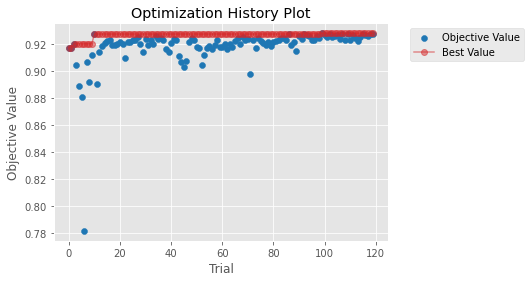

In [146]:
optuna.visualization.matplotlib.plot_optimization_history(study)

In [147]:
study.best_params

{'ourlearning_rate': 0.04412728858023737,
 'estimators': 848,
 'sample': 0.5065161823675346,
 'depth': 6,
 'alpha': 0.016142211005188506,
 'lambda': 6.581706775865108,
 'colsample_bytree': 0.8491807944945587,
 'ourgamma': 0.18765153742942975,
 'childweight': 4}

-------------------------------------------------------------------------------------------------------------------------------

In [149]:
xgb_optuna=xgboost.XGBRegressor(learning_rate=0.04412728858023737,n_estimators=848,subsample=0.5065161823675346,max_depth=6,min_child_weight=4,
               reg_alpha=0.016142211005188506,reg_lambda=6.581706775865108,colsample_bytree=0.8491807944945587,
               gamma=0.18765153742942975).fit(x_train,y_train)

In [150]:
train_pred=xgb_optuna.predict(x_train)
test_pred=xgb_optuna.predict(x_test)

In [151]:
r_squared_trained= r2_score(y_train, train_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9281


In [153]:
r_squared_test = r2_score(y_test, test_pred)
print('The train R-square value is: ', r_squared.round(4))

The train R-square value is:  0.9281


In [154]:
mse = mean_squared_error(y_test, test_pred)

print('RMSE = ', np.sqrt(mse).round(4))

RMSE =  4.1665


In [155]:
ourscores= cross_val_score(xgb_optuna,x_train,y_train,scoring='r2',n_jobs=-1,cv=10)
print(np.mean(ourscores),np.std(ourscores))
print(ourscores)

0.9275093611010841 0.025221853673889467
[0.90781388 0.92886171 0.90666624 0.96916334 0.89475144 0.91391568
 0.95156997 0.94235025 0.95943473 0.90056637]


### Saving the Model

In [156]:
import joblib

In [157]:
model=joblib.dump(lasso_model,'D:/E-pi\ML/Capstone_1/model_xgb_optuna.h5')